# CITE-seq protein acceleration analysis

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import velocyto as vcy
%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
#import protaccel.protaccel as pa
import pa

Import protein count data. Acquired from https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE100866, file **GSE100866_PBMC_vs_flow_10X-ADT_umi.csv.gz**.


In [4]:
[prot_count_array,prot_cells,adt_names] = pa.import_prot_data('/data/hoan/sc_velocity/data/GSE100866_PBMC_vs_flow_10X-ADT_umi.csv')

Display proteins with available data. 

In [5]:
print(adt_names)

['CD3' 'CD4' 'CD8' 'CD2' 'CD45RA' 'CD57' 'CD16' 'CD14' 'CD11c' 'CD19']


`cellranger` processing:

`cellranger count --id=(desired bam directory) --transcriptome=(transcriptome directory) --fastqs=(fastq directory) --localcores=40 --localmem=100 --chemistry=SC3Pv2`

`velocyto` processing:
`velocyto run10x --samtools-threads 60 --samtools-memory 5000 (desired bam directory) (transcriptome directory)/genes/genes.gtf`



Import `velocyto` command-line interface (CLI) pipeline output.

In [6]:
vlm = vcy.VelocytoLoom("/data/hoan/sc_velocity/data/SPBMC_run3.loom")

Select 3000 genes with highest variability.

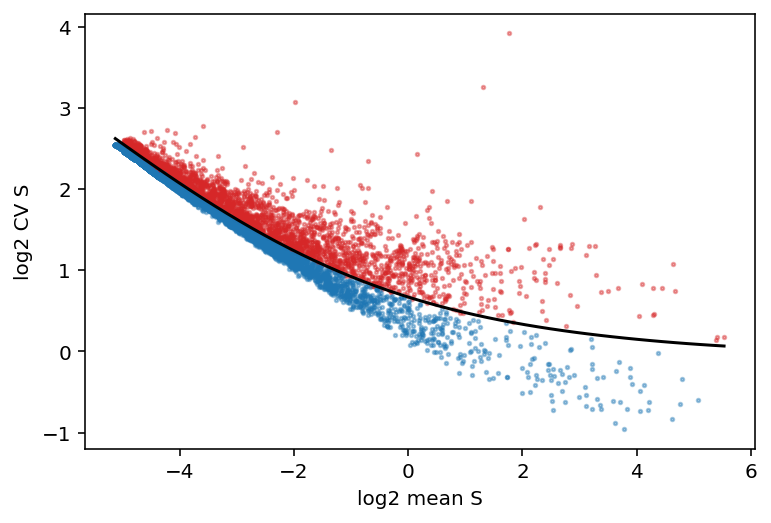

In [7]:
vlm.score_cv_vs_mean(3000, plot=True, max_expr_avg=50, winsorize=True, winsor_perc=(1,99.8), svr_gamma=0.01, min_expr_cells=50)
vlm.score_detection_levels(min_expr_counts=40, min_cells_express=30)

Define relationship between proteins and source mRNA. Define mRNA to be used for phase portrait visualization.

In [8]:
gene_dict = {'CD3':['CD3D','CD3E','CD3G'], 
             'CD4':['CD4'],
             'CD8':['CD8A','CD8B'],
             'CD2':['CD2'],
             'CD45RA':['PTPRC'],
             'CD57':['B3GAT1'],
             'CD16':['FCGR3A','FCGR3B'],
             'CD14':['CD14'],
             'CD11c':['ITGAX'],
             'CD19':['CD19']}

InvertDict = lambda d: dict( (v,k) for k in d for v in d[k] )


mrna_targets = ['CD3D','CD3E','CD3G','CD4','CD8A','CD8B','CD2',
                'PTPRC','FCGR3A','CD14','ITGAX','CD19']

Define inverse relationship.

In [9]:
prot_dict = InvertDict(gene_dict)

Append genes that yield observed proteins even if variability is relatively low for RNA velocity phase plots. Filter genes. Save ADT names.

In [10]:
pa.enforce_protein_filter(vlm,mrna_targets,adt_names)

In [11]:
vlm.filter_genes(by_cv_vs_mean=True,by_detection_levels=True)

Check format of intersection cell IDs. Filter for intersection of cell UMIs. 

In [12]:
vlm.ca['CellID'][0]

'SPBMC_run3:ACACCCTGTGGCTCCAx'

In [13]:
first_char = vlm.ca['CellID'][0].find(':')+1
last_char = -1

[prot_count_array, shared_cells, prot_cells] = pa.shared_cells_filter(vlm, prot_cells, prot_count_array, first_char, last_char)

ADT cell number: 7985
RNAseq cell number: 1789
Shared cells: 1780
Shared cells with more than 5 molecules: 1780


Perform knn imputation using protein space (more robust due to higher counts, less subject to the curse of dimensionality due to low number of quantified proteins vs. RNA).

In [14]:
pa.impute(vlm, prot_count_array, k=400, impute_in_prot_space=True, size_norm=False, impute_in_pca_space=False)

Find clusters in protein space in order to ID cell types.

In [15]:

t_cl = [0,2,1,3,4]
[cluster_ID, num_clusters] = pa.identify_clusters(vlm,vlm.connectivity,
                                                  correct_tags=True,tag_correction_list=t_cl,
                                                  method_name='ModularityVertexPartition',seed=2132)

In [16]:
COLORS=np.asarray([[0, 0.4470, 0.7410], #CD4
                    [0.4940, 0.1840, 0.5560], #Mono
                    [0.9290, 0.6940, 0.1250], #B
                    [0.4660, 0.6740, 0.1880], #NK
                    [0.8500, 0.3250, 0.0980] #CD8
                  ])
cluster_labels = ['CD4+ T','Mono.','B','NK','CD8+ T']
vlm.COLORS = COLORS
vlm.labels=cluster_labels

Visualize clusters in PC1/2 and PC2/3.

In [17]:
pa.fit_pcs(vlm,'P_norm','prot_pcs',n_pcs=4)

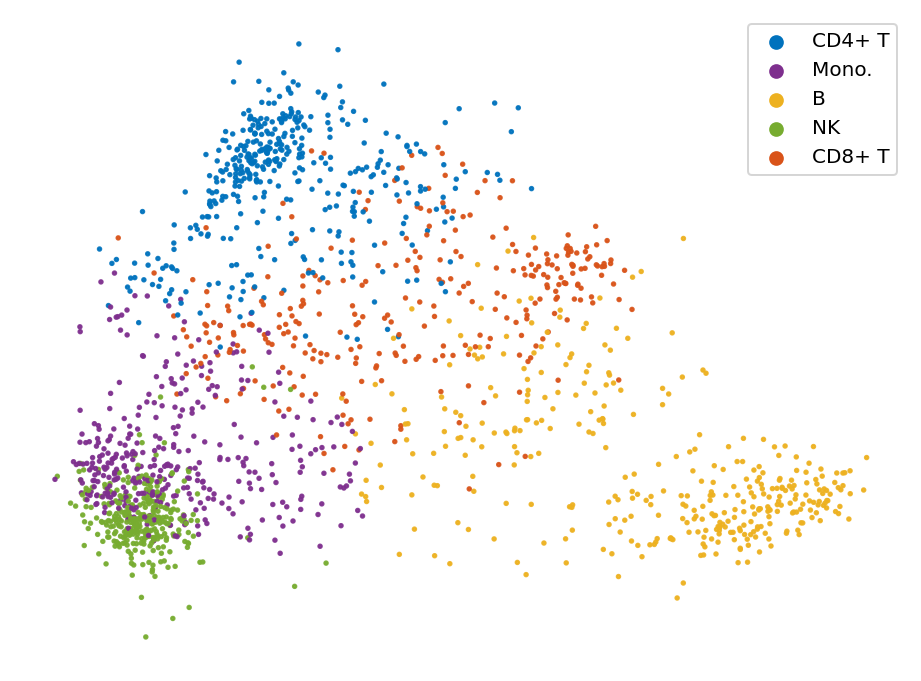

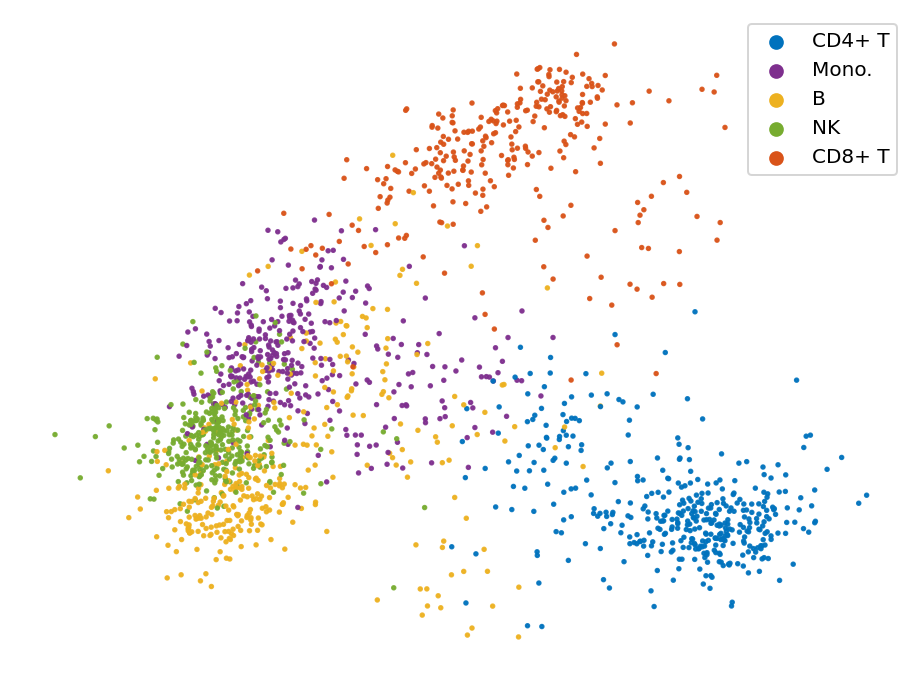

In [18]:
pa.visualize_pcs(vlm, [1,2])
pa.visualize_pcs(vlm, [2,3])

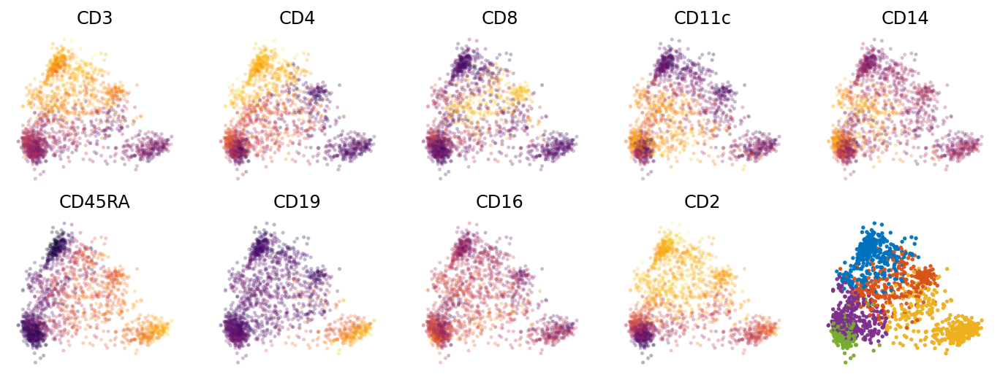

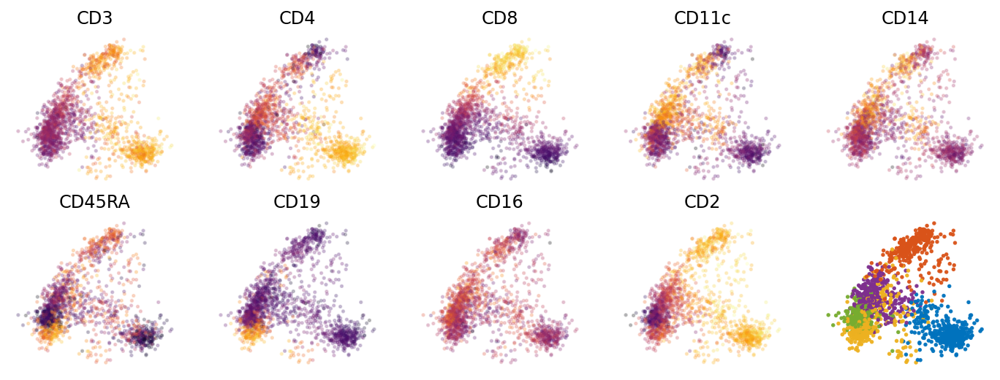

In [19]:
marker_list = ['CD3','CD4','CD8','CD11c','CD14','CD45RA','CD19','CD16','CD2']
pa.visualize_protein_markers(vlm, protein_markers=marker_list, pc_targets=[1,2], visualize_clusters= True)
#plt.savefig("fig/cite_clus1.svg")
pa.visualize_protein_markers(vlm, protein_markers=marker_list, pc_targets=[2,3], visualize_clusters= True)
#plt.savefig("fig/cite_clus2.svg")

Visualize protein phase portraits.

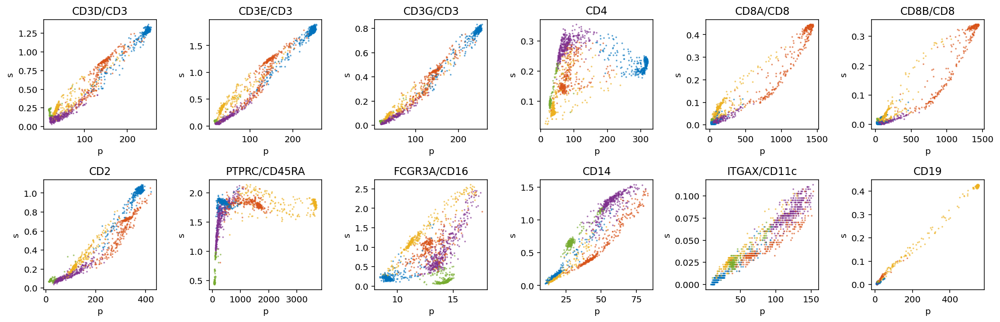

In [20]:
pa.visualize_phase_portraits(vlm, mrna_targets, target='protein', imputed=True, prot_dict=prot_dict)

Manually select RNA/protein pairs with reasonably diagonal plots for protein velocity.

In [21]:
genes_used_for_prot_velocity = ['CD3D','CD8A','FCGR3A','CD14','ITGAX','CD19','CD2']
adt_used_for_prot_velocity = ['CD3','CD8','CD16','CD14','CD11c','CD19','CD2']

Perform PCA in spliced space for embedding.

In [22]:
target_size_median = [np.median(vlm.S.sum(0)), np.median(vlm.U.sum(0))]
vlm.normalize(which="both",size=True,target_size=target_size_median)
pa.fit_pcs(vlm,'S_norm','pcs',3)

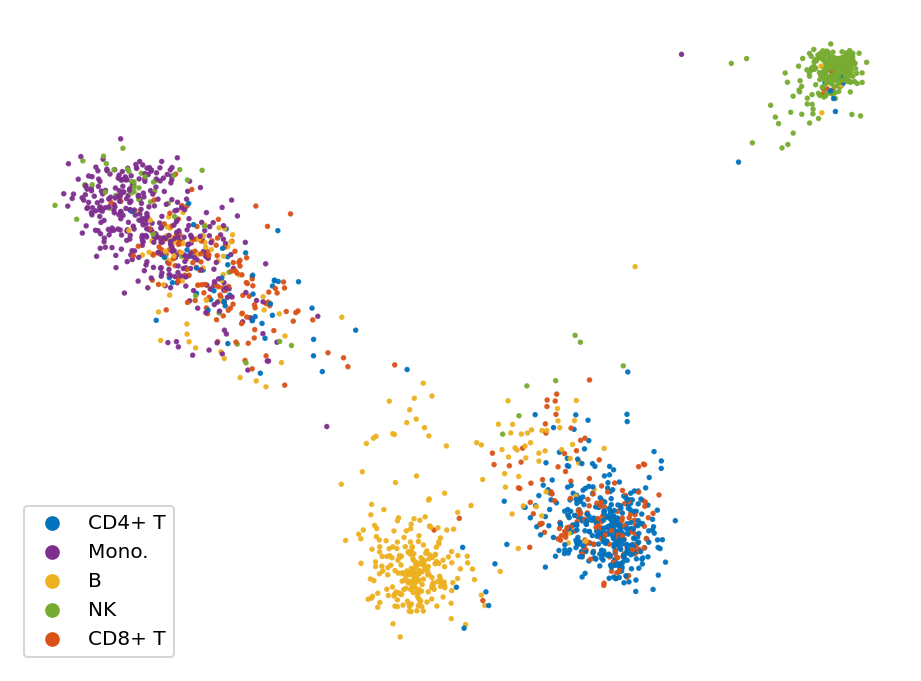

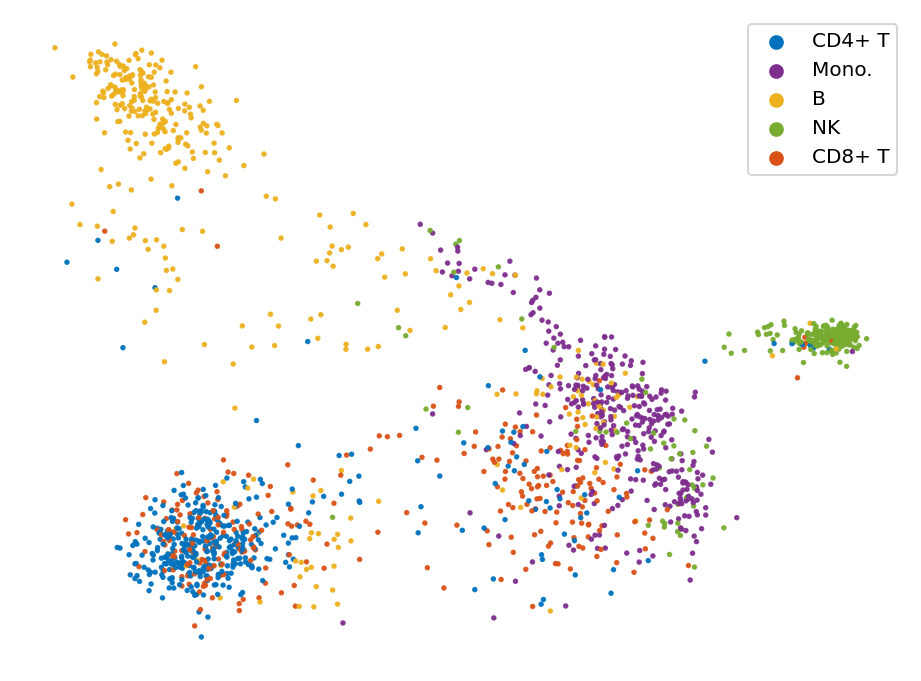

In [23]:
pa.visualize_pcs(vlm, [1,2], pc_space='pcs')
pa.visualize_pcs(vlm, [2,3], pc_space='pcs')

Fit degradation parameters; extrapolate.

In [24]:
pa.gamma_fit(vlm,'Sx','Ux','rna')
pa.extrapolate(vlm,vel_type='rna')

In [25]:
pa.gamma_fit(vlm,'Px','Sx','protein',genes_used_for_prot_velocity, adt_used_for_prot_velocity)
pa.extrapolate(vlm,vel_type='protein')

Examine parameter fits.

In [26]:
n_rna_velo_fit_viz = 24
np.random.seed(948329843)
print(str(len(vlm.rna_velo_gene_ind))+' spliced/unspliced gene pairs have diagonal phase portraits by R2. Displaying '\
      +str(n_rna_velo_fit_viz)+' random phase portraits:')
genes_for_rna_velo_fit=np.random.choice(vlm.rna_velo_gene_ind,n_rna_velo_fit_viz,replace=False)

1172 spliced/unspliced gene pairs have diagonal phase portraits by R2. Displaying 24 random phase portraits:


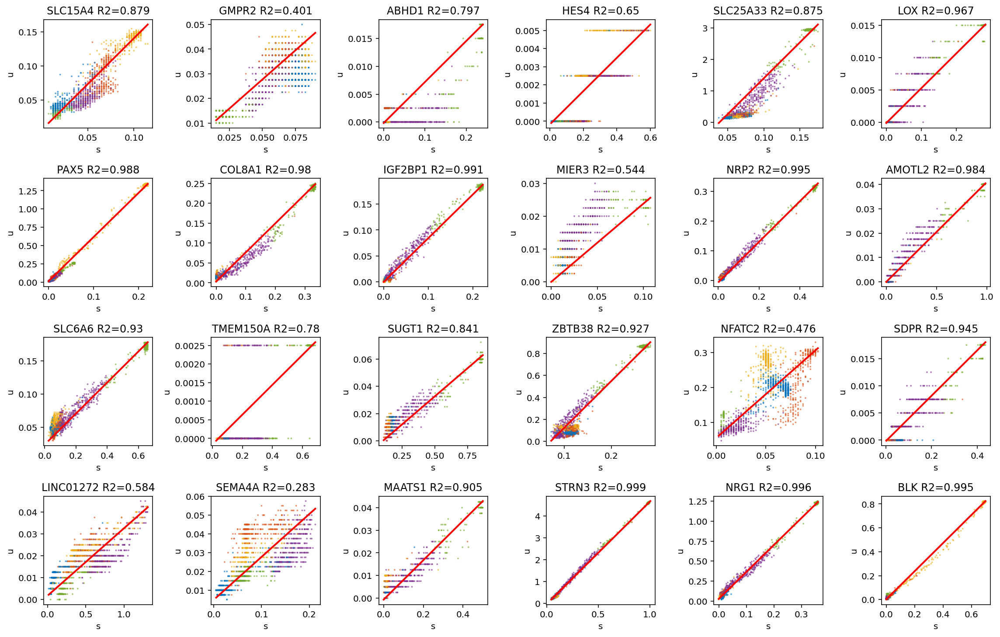

In [27]:
rna_vel_genes=vlm.ra['Gene'][genes_for_rna_velo_fit]
pa.visualize_phase_portraits(vlm, rna_vel_genes, target='mrna', plot_fit=True)
plt.savefig("fig/cite_rnaphase.svg")

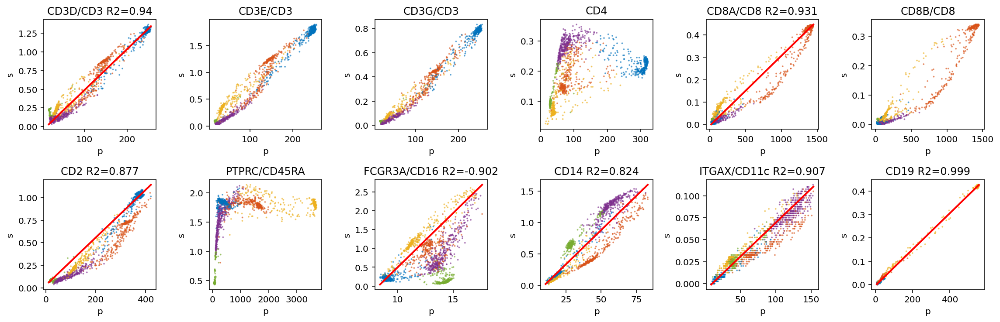

In [28]:
pa.visualize_phase_portraits(vlm, mrna_targets, target='protein', imputed=True, prot_dict=prot_dict, plot_fit=True)
plt.savefig("fig/cite_protphase.svg")

Project velocity direction into the embedding using the transition matrix method.

In [29]:
pa.identify_embedding_knn(vlm,'pcs',[1,2])

In [30]:
pa.calculate_embedding_delta(vlm,'Sx','delta_S','delta_S_in_S_pca','rna_velo_gene_ind')

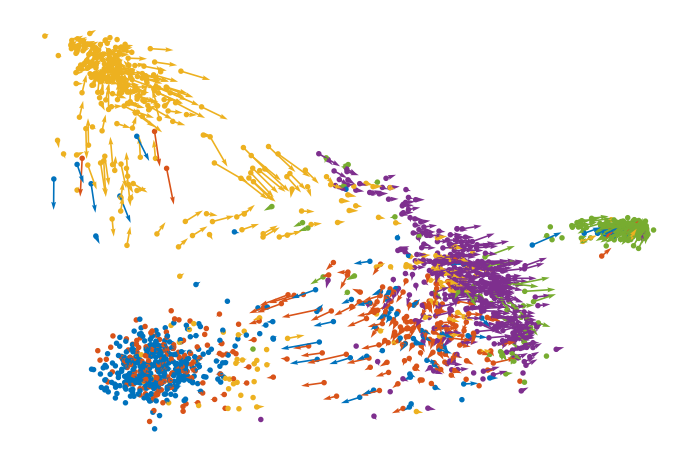

In [31]:
pa.visualize_velocity_projection(vlm, 'delta_S_in_S_pca')

In [32]:
pa.calculate_embedding_delta(vlm,'Px','delta_P','delta_P_in_S_pca','prot_velo_prot_ind')

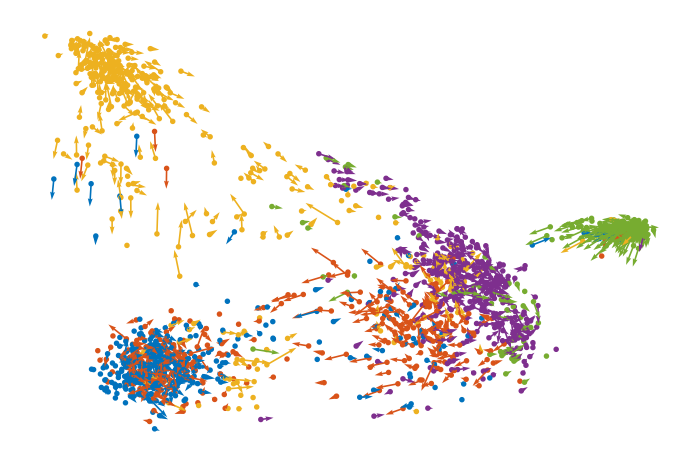

In [33]:
pa.visualize_velocity_projection(vlm, 'delta_P_in_S_pca')

Visualize cluster-specific velocities.

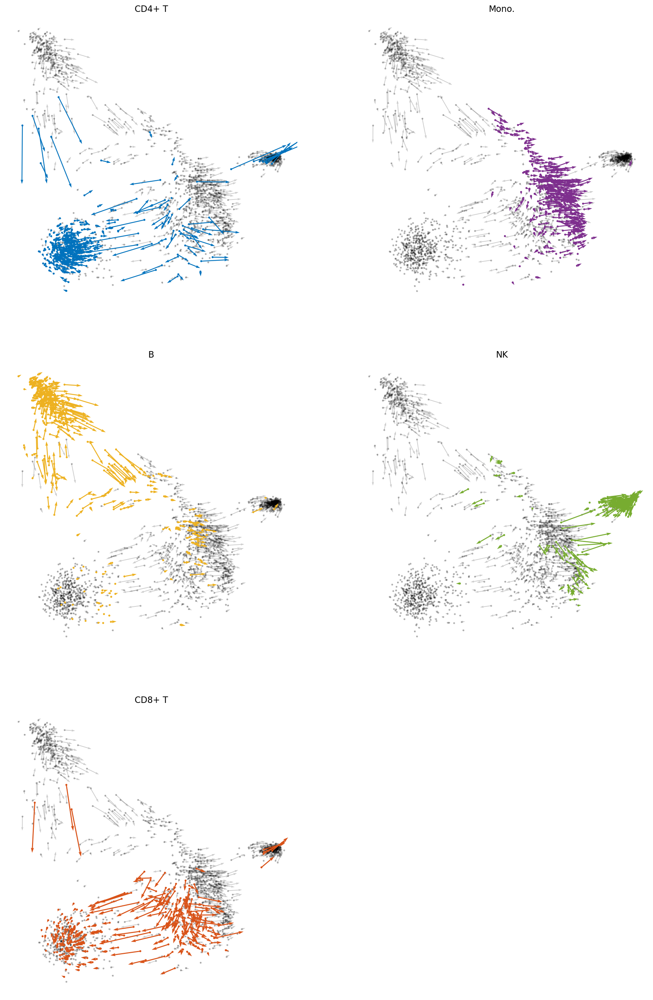

In [34]:
pa.cluster_specific_plot(vlm, 'delta_S_in_S_pca',draw_cells=True)
plt.savefig("fig/cite_rnav.svg")

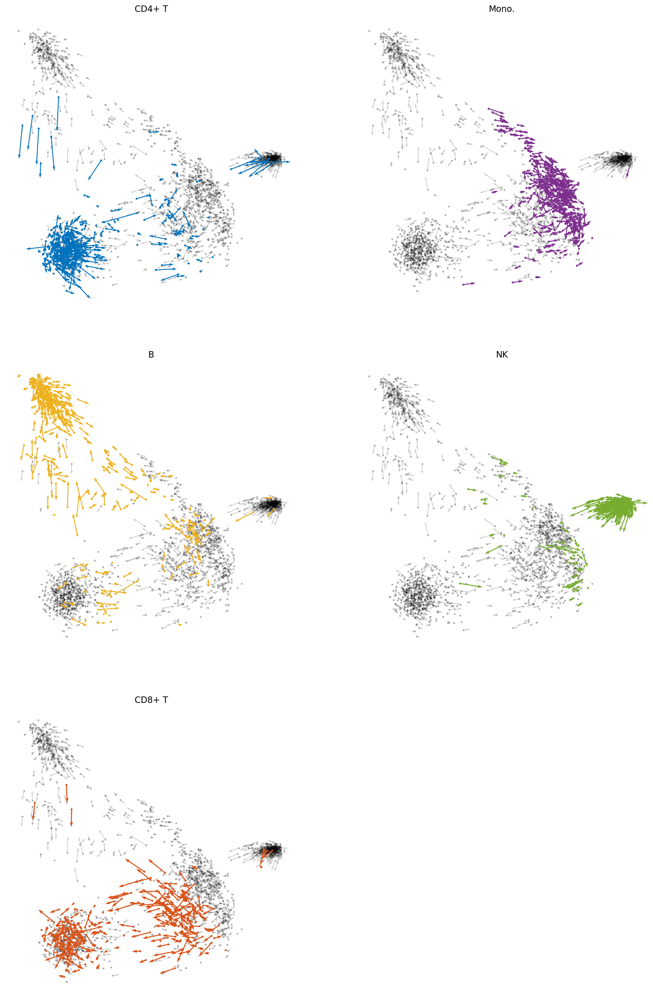

In [35]:
pa.cluster_specific_plot(vlm, 'delta_P_in_S_pca',draw_cells=True)
plt.savefig("fig/cite_protv.svg")

Prepare and perform grid embedding.

In [36]:
pa.initialize_grid_embedding(vlm)
uv_multiplier=1.4
pa.calculate_grid_arrows(vlm,'delta_S_in_S_pca', '_rna', min_mass=5,uv_multiplier=uv_multiplier)
pa.calculate_grid_arrows(vlm,'delta_P_in_S_pca', '_prot', min_mass=5,uv_multiplier=uv_multiplier)

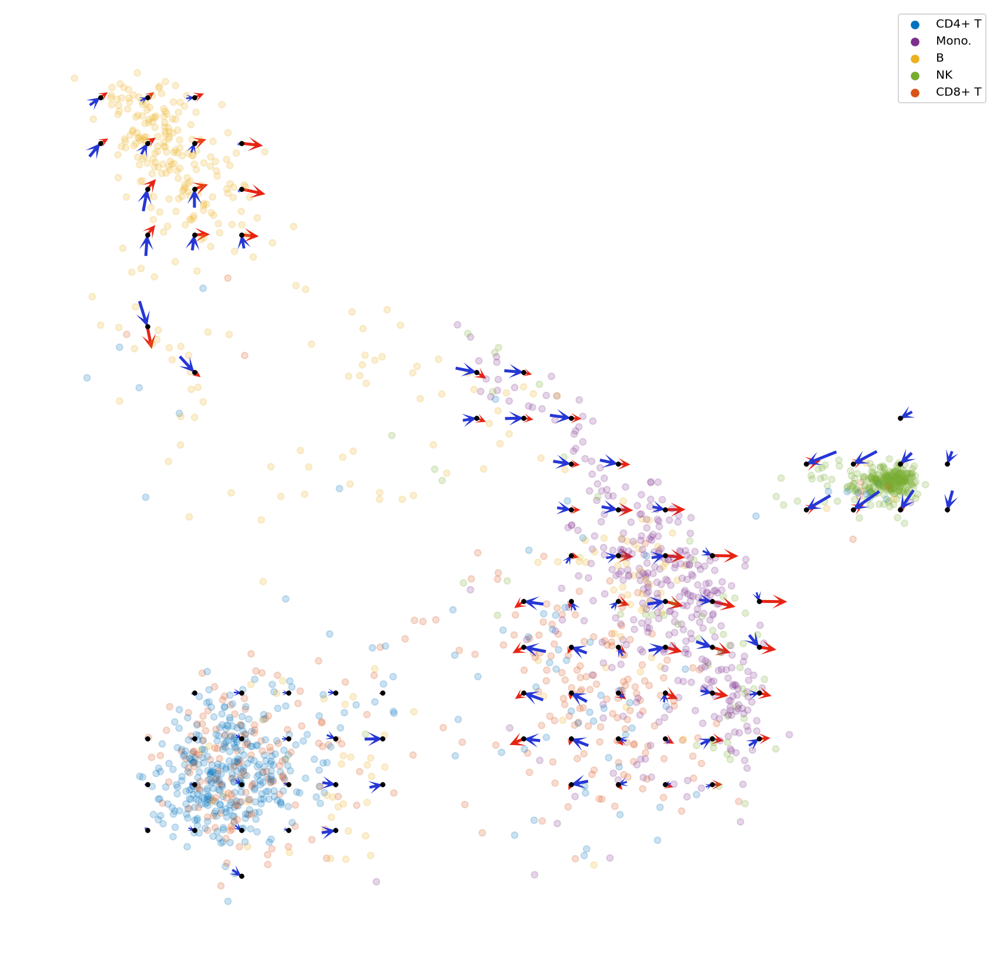

In [37]:
r_rnav = [231/255,36/255,20/255]
b_protv = [38/255,55/255,213/255]
plt.figure(figsize=(15,15))
arr_scale=1
pa.plot_grid_arrows(vlm,'UV_rna',plot_cells=False, arr_col=r_rnav,arr_scale=arr_scale)
pa.plot_grid_arrows(vlm,'UV_prot',plot_cells=True, arr_col=b_protv, color_cells_by_cluster=True, pivot='tip',
                    arr_scale=arr_scale,cell_alpha=0.2,write_labels=True)
plt.savefig("fig/cite_comb.svg")

In [38]:
plt.figure(figsize=(15,15))
#pa.plot_bezier(vlm, plot_cells=True, color_cells_by_cluster=True,cell_alpha=0.2,write_labels=True)
#plt.savefig("fig/cite_bez.svg")

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

Calculate t-SNE embedding based on normalized spliced counts. Perform analysis in t-SNE space. 

In [39]:
pa.fit_pcs(vlm,'S_norm','pcs',25)

In [40]:
pa.fit_tsne(vlm, 'pcs', 'tsne', 25,seed=20)

In [41]:
pa.identify_embedding_knn(vlm,'tsne',[0,1])

In [42]:
pa.calculate_embedding_delta(vlm,'Sx','delta_S','delta_S_in_S_tsne','rna_velo_gene_ind')

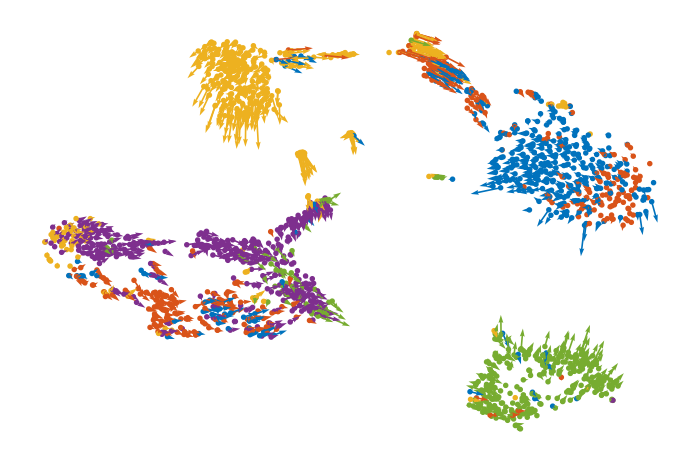

In [43]:
pa.visualize_velocity_projection(vlm, 'delta_S_in_S_tsne')

In [44]:
pa.calculate_embedding_delta(vlm,'Px','delta_P','delta_P_in_S_tsne','prot_velo_prot_ind')

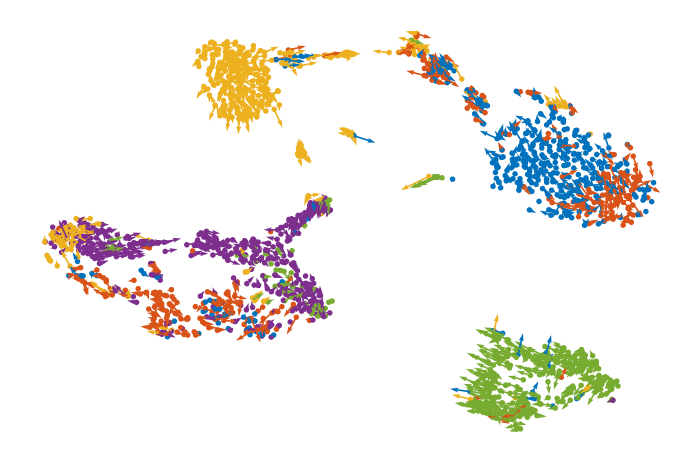

In [45]:
pa.visualize_velocity_projection(vlm, 'delta_P_in_S_tsne')

Visualize cluster-specific velocities.

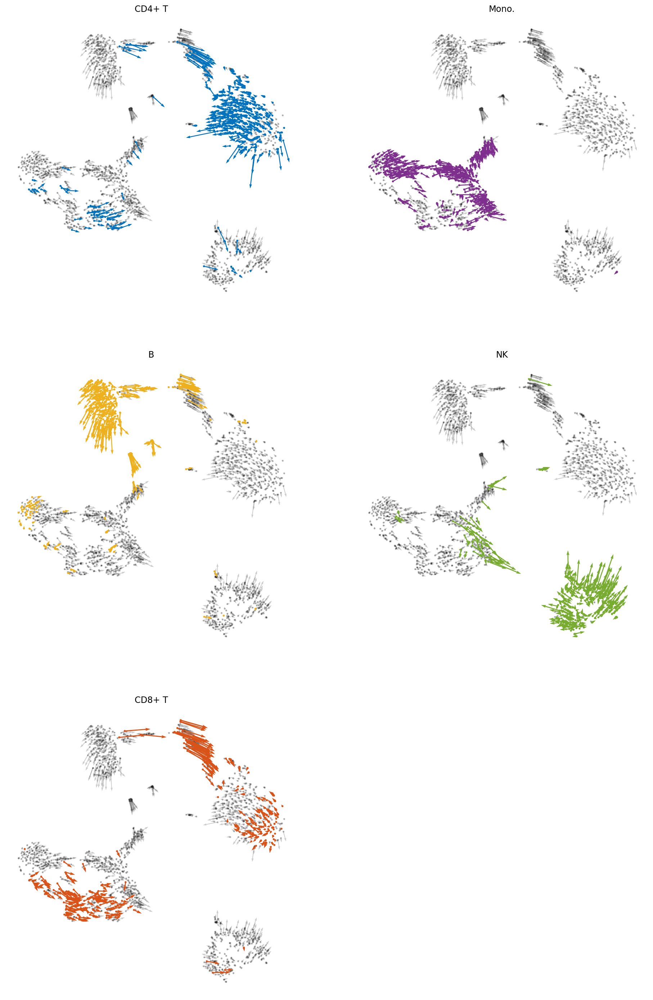

In [46]:
pa.cluster_specific_plot(vlm, 'delta_S_in_S_tsne',draw_cells=True)

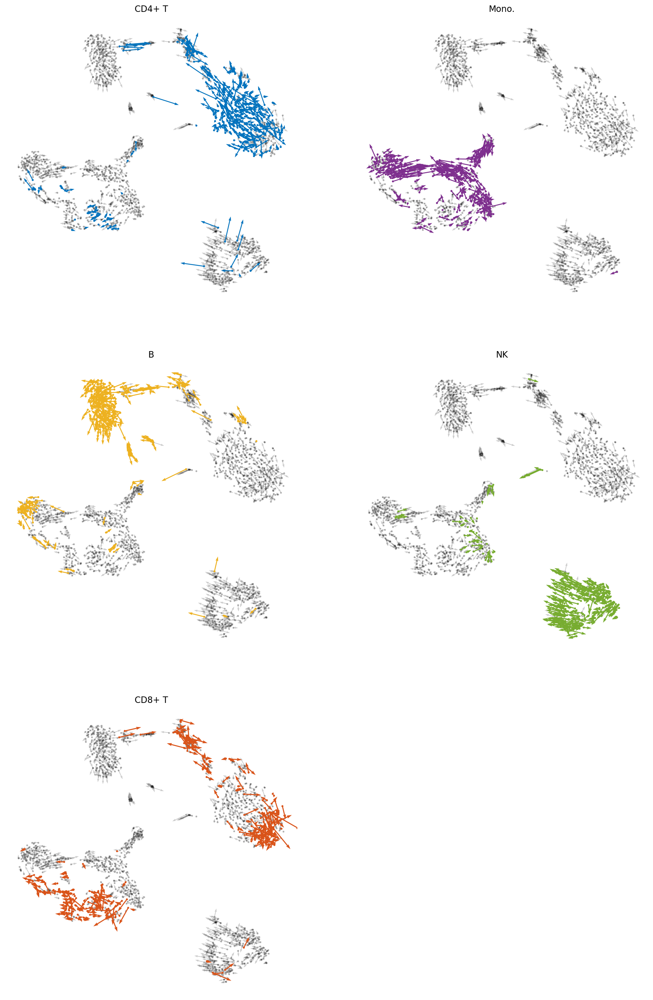

In [47]:
pa.cluster_specific_plot(vlm, 'delta_P_in_S_tsne',draw_cells=True)

Prepare and perform grid embedding.

In [48]:
if hasattr(vlm,'mass_filter'):
    delattr(vlm,'mass_filter')
pa.initialize_grid_embedding(vlm, n_neighbors=20)
uv_multiplier=8
pa.calculate_grid_arrows(vlm,'delta_S_in_S_tsne', '_rna', min_mass=0.5,uv_multiplier=uv_multiplier+4)
pa.calculate_grid_arrows(vlm,'delta_P_in_S_tsne', '_prot', min_mass=0.5,uv_multiplier=uv_multiplier)

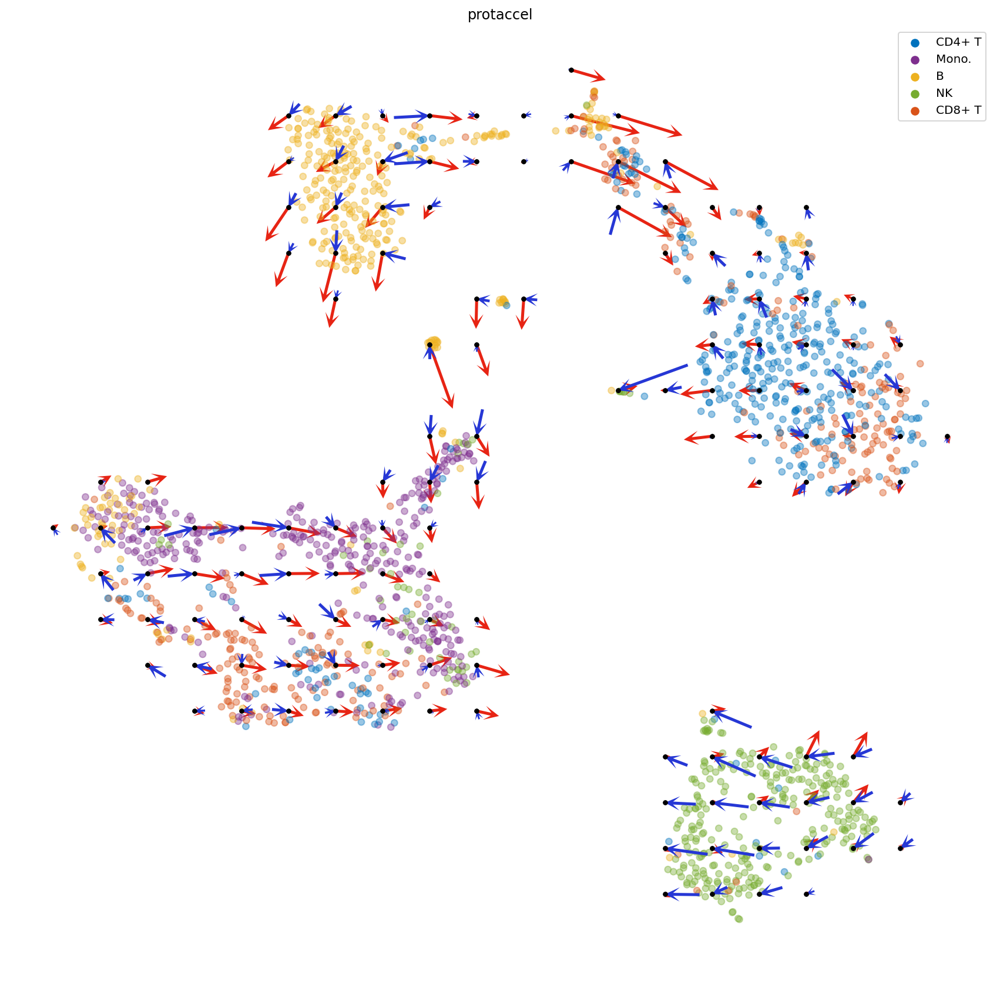

In [49]:
r_rnav = [231/255,36/255,20/255]
b_protv = [38/255,55/255,213/255]
plt.figure(figsize=(15,15))
pa.plot_grid_arrows(vlm,'UV_rna',plot_cells=False, arr_col=r_rnav,arr_scale=1)
pa.plot_grid_arrows(vlm,'UV_prot',plot_cells=True, arr_col=b_protv, color_cells_by_cluster=True, 
                    pivot='tip',cell_alpha=0.4,arr_scale=1,write_labels=True)
plt.title('protaccel')
#plt.savefig("/home/vanhoan310/python_code/sc_velocity/fig/cbmc_unimodal.svg")
plt.savefig("/data/hoan/plots/citeseq_protaccel.pdf")

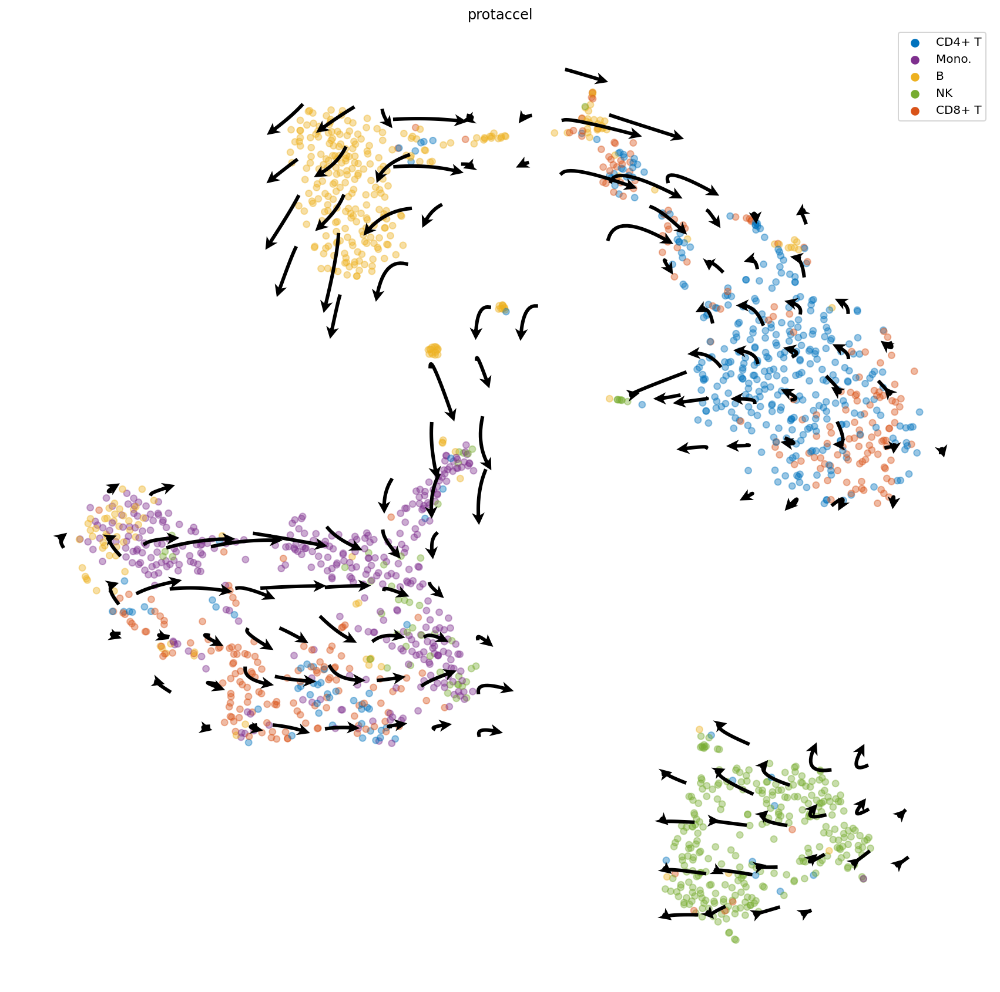

In [50]:
%reload_ext autoreload
%autoreload 2
import pa
plt.figure(figsize=(15,15))
pa.plot_bezier(vlm, plot_cells=True, color_cells_by_cluster=True, arr_len_scal=1,cell_alpha=0.4,write_labels=True)
plt.title('protaccel')
plt.savefig("/data/hoan/plots/citeseq_bez_protaccel.pdf")